In [1]:
import random
import json
import os, sys
from importlib import reload
from pathlib import Path
import numpy as np
import pandas as pd

import re

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import confusion_matrix
from transformers import AutoTokenizer

random.seed(6)
np.random.seed(6)

hugg_auth_token = os.environ.get("HUGGINGFACE_KEY")


Disabling PyTorch because PyTorch >= 2.1 is required but found 2.0.0
None of PyTorch, TensorFlow >= 2.0, or Flax have been found. Models won't be available and only tokenizers, configuration and file/data utilities can be used.


In [2]:
# My modules

WORK_DIR = Path.cwd().parent
sys.path.append(str(WORK_DIR))

from src import (
    response_processing as rp,
    video_tools)

from src.viz_utils import qa_viz
from src.STAR_utils.visualization_tools import qa_visualization as videoviz


In [3]:
# Files
STAR_VAL_SMALL = WORK_DIR / "data/datasets/STAR/STAR_annotations/STAR_val_small_1000.json"

VQA_RESP = WORK_DIR / "outputs/vqa_video_fps_gemma3:4b-it-qat_20250629_16:44:00.jsonl"
QA_SGG = WORK_DIR / "outputs/gr_understaing_on_genstg_20250628_00:26:00_val_gemma3:4b-it-qat_20250620_20:39:00.jsonl"
#QA_SGG = WORK_DIR / "outputs/gu_on_sgg2_gemma3:4b-it-qat_20250t03_18:18:00.jsonl"
SGG_GRAPHS = WORK_DIR / "outputs/sgg/sgg_1fps_batchframes_gemma3:4b-it-qat_20250628_00:26:00.jsonl"

RAW_VIDEO_DIR = Path(WORK_DIR / 'data/datasets/action-genome/Charades_v1_480/')
SAVE_VIDEO_DIR = Path(WORK_DIR / "experiments/video_dump")


prev_analyzed = [
    "Interaction_T1_4054",
    "Interaction_T1_8913",
    "Interaction_T2_3423",
    "Interaction_T1_4115",
    "Interaction_T1_1168",
    "Interaction_T1_309",
    "Interaction_T1_4703",
    "Interaction_T1_2516",
    "Interaction_T1_8967",
    "Interaction_T1_5709",
    "Interaction_T1_2226",
    "Interaction_T1_111",
    "Interaction_T1_8274",
    "Interaction_T1_7254",
    "Interaction_T1_4221",
    #"Interaction_T1_3485",
    #"Interaction_T4_4181",
    #"Interaction_T2_1847",
]


# Experiment
### Comparison between VQA and QA on generated frames - same sample rate from video


**Parameters:**
- model: Gemma3:4b-it-qat
- user_prompt: vqa/user_prompt_v2.txt
- temperature: 0.1
- sampling method: (default) top-p (p=0.9)

# Prompts

## VQA

In [4]:
with open(WORK_DIR / 'data/prompts/vqa/user_prompt_v2.txt', 'r') as f:
    pr = f.read()

print(pr)


You are an intelligent video comprehension model and are going to receive as input a sequence of images extracted from a video and a question. You need to analyze and describe the scene unfolding in the video (sequence of frames) following these guidelines:
1. Look for recurring objects;
2. Note that the same object may appear differently across frames due to low image quality, varying viewing angles, or partial obstructions. Carefully check objects with similar features (e.g. shape, color), appearing in different frames, as they may still be the same object;
3. Pay attention to how the person interacts with its environment
4. Understand the directional movement of the people and objects in the video
5. Carefully analyze the chronological sequence of the events occurring in the video;
6. Pay attention to the atomic and fine grained movement, pose and actions of the people in the video. Compose these atomic actions happening across the frame to infer the higher level action performed by

In [5]:
with open(WORK_DIR / 'data/prompts/zero-shot-cot/auto_reply_ZS_CoT.txt', 'r') as f:
    pr = f.read()

print(pr)


Therefore the final answer is?

Your response must be provided in valid JSON format as follows:
{"answer": "your complete answer here"}

IMPORTANT: Always include both the letter (A, B, C, D, etc.) AND the full text of the answer in your response.
Do not abbreviate or shorten the answer. For example, if the correct answer is "A. the laptop", your response 
should be {"answer": "A. the laptop"}, not {"answer": "laptop"} or {"answer": "A"}.\



## SGG

In [6]:
with open(WORK_DIR / "data/prompts/graph-gen/user_prompt_v2.txt") as f:
    pr = f.read()
    
print(pr)
    


You are an intelligent video comprehension model and are going to receive as input a sequence of images extracted from a video and a question. You need to analyze and describe the scene unfolding in the video (sequence of frames) following these guidelines:
1. Look for recurring objects;
2. Note that the same object may appear differently across frames due to low image quality, varying viewing angles, or partial obstructions. Carefully check objects with similar features (e.g. shape, color), appearing in different frames, as they may still be the same object;
3. Pay attention to how the person interacts with its environment
4. Understand the directional movement of the people and objects in the video
5. Carefully analyze the chronological sequence of the events occurring in the video;
6. Pay attention to the atomic and fine grained movement, pose and actions of the people in the video. Compose these atomic actions happening across the frame to infer the higher level action performed by

In [7]:
with open(WORK_DIR / "data/prompts/graph-gen/format_instructions_v2.txt") as f:
    pr = f.read()
    
print(pr)
    


Now organize the objects and relationships you identified before into a formal scene graph using this format:
object1 ---- relationship ---- object2

The list of relationship predicates should be introduced for each frame should be introduce by the frame ID or 
name and finally by the tag <scene_graph> and terminated by the tag </scene_graph>.

For example:
Frame 0:
<scene_graph>
man ---- sitting_on ---- chair
dog ---- lying_under ---- table
book ---- on_top_of ---- shelf
...
</scene_graph>

Frame 2:
<scene_graph>
woman ---- on_the_left_of ---- man
...
<scene_graph>
...


Please follow these guidelines:
1. Create an adequate number of relationship triplets (more if the image is complex)
2. Use specific and consistent object labels
3. Use concise but descriptive relationship terms (connect words with underscores)
4. Include all meaningful relationships between objects
5. Verify that all objects you identified in step 1 appear in at least one relationship
6. You can condense multiple vis

### Graph understanding from the SGG

Launch script:

```bash
  python -m star_code.src.main \
  --task graph-understanding \
  --model gemma3:4b-it-qat \
  --model-options star_code/ollama_model_options.json \
  --prompt-type mcq_zs_cot \
  --sys-prompt star_code/data/prompts/zero-shot-cot/MCQ_system_prompt_ZS_CoT.txt \
  --user-prompt star_code/data/prompts/zero-shot-cot/MCQ_user_prompt_ZS_CoT_v4.txt \
  --mode chat \
  --reply-file star_code/data/prompts/zero-shot-cot/auto_reply_ZS_CoT.txt \
  --dataset-type star \
  --input-file star_code/data/datasets/STAR/STAR_annotations/STAR_val_small_1000.json \
  --stsg-file star_code/outputs/gen_stsg_videofps_gemma3:4b-it-qat_20250628_00:26:00.jsonl \
  --output-file star_code/outputs/gr_understaing_on_genstg_20250628_00:26:00_val_gemma3:4b-it-qat_20250701_11:27:00.jsonl 
```

In [8]:
with open(WORK_DIR / "data/prompts/zero-shot-cot/MCQ_system_prompt_ZS_CoT.txt") as f:
    pr = f.read()
    
print(pr)
    


You need to respond to reasoning questions by making logical inference on sequence of Scene-Graphs extracted from frames belonging to a video, called a Spatio-Temporal Scene Graph.

IMPORTANT CLARIFICATIONS:
- You will receive a question and Spatio-Temporal Scene-Graph
- Each Scene-Graph is a static symbolic representation of the scene unfolding in the frame
- The Scene-Graphs are ordered chronologically
- The Scene-Graph is represented as a set of tuple in the format: subject - relationship - object
- The Spatio-Temporal Scene-Graph is a cornologically sorted list of Scene-Graphs

INSTRUCTIONS:
- Read the entire Spatio-Temporal Scene-Graphs in chronological order and pay attention at the order of how events unfold.
- Read the question and reason about the answer step by step.
- In your answer include key events or relationships that help you in determing the correct answer.
- Be careful to reproduce the chosen alternative as it is presented.


In [9]:
with open(WORK_DIR / "data/prompts/zero-shot-cot/MCQ_user_prompt_ZS_CoT_v3.txt") as f:
    pr = f.read()
    
print(pr)
    


Please carefully read the following Spatio-Temporal Scene Graph delimited by the <STSG> tags and provide an answer to the question below:

<STSG>
{stsg}
</STSG>

Given the following question:
<Q>
{question}
<Q>

And the following alternatives:
<Alternatives>
A. {c1}
B. {c2}
C. {c3}
D. {c4}
</Alternatives>

Provide an answer to the above question reasoning step by step on the Spatio-Temporal Scene-Graph (STSG) and choosing one of the alternatives. 

In answering the question please be sure to operate according to the following guidlines:
1. Question Interpretation: Clearly state what the question is asking
2. STSG Analysis: Carefully examine the spatial and temporal relationships in the scene graph
3. Alternative Evaluation: For each option (A, B, C, D), explain whether it matches the STSG evidence
4. Reasoning: Provide clear logical step by step reasoning leading to your conclusion
5. Conclusion: Declare the logical conclusion to your reasoning in the above step
6. Consistency Check: B

In [10]:
with open(WORK_DIR / "data/prompts/zero-shot-cot/auto_reply_ZS_CoT.txt") as f:
    pr = f.read()
    
print(pr)
    


Therefore the final answer is?

Your response must be provided in valid JSON format as follows:
{"answer": "your complete answer here"}

IMPORTANT: Always include both the letter (A, B, C, D, etc.) AND the full text of the answer in your response.
Do not abbreviate or shorten the answer. For example, if the correct answer is "A. the laptop", your response 
should be {"answer": "A. the laptop"}, not {"answer": "laptop"} or {"answer": "A"}.\



# Loading GT

Let's load the ground truth from the `STAR_QA_question_and_stsg_val.json` file where we extracted QA and spatio-temporal scene graphs

In [11]:
with open(WORK_DIR / 'data/datasets/STAR/STAR_annotations/STAR_val_small_1000.json') as f:
    ground_truth = json.load(f)


gt_df = pd.DataFrame(ground_truth).astype({'question_id': 'string', 'answer': 'string'})
gt_df.rename(columns={"question_id": "id", "answer": "text"}, inplace=True)
gt_df.set_index('id', inplace=True)
gt_df.info()


<class 'pandas.core.frame.DataFrame'>
Index: 1048 entries, Feasibility_T5_102 to Interaction_T4_4181
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   question          1048 non-null   object 
 1   video_id          1048 non-null   object 
 2   start             1048 non-null   float64
 3   end               1048 non-null   float64
 4   text              1048 non-null   string 
 5   question_program  1048 non-null   object 
 6   choices           1048 non-null   object 
 7   situations        1048 non-null   object 
dtypes: float64(2), object(5), string(1)
memory usage: 73.7+ KB


# Loading predicted answers evaluation

In [12]:
reload(rp)


<module 'src.response_processing' from '/home/lusha/star_code/src/response_processing.py'>

In [13]:
pred_vqa_df = rp.gemma3_ans_extract(VQA_RESP)
pred_sgg_df = rp.gemma3_ans_extract(QA_SGG)


Total answers: 1039
Answers following JSON template: 1039
Percentage following JSON template: 100.00%
Answer following the template: 1039
100.00% of the total

Only 0 samples do not contain the answer in the response with the specified format


/home/lusha/star_code/src/response_processing.py:182: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  predictions_df["answer"] \


Total answers: 1039
Answers following JSON template: 1039
Percentage following JSON template: 100.00%
Answer following the template: 1035
99.62% of the total

Only 4 samples do not contain the answer in the response with the specified format


/home/lusha/star_code/src/response_processing.py:182: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  predictions_df["answer"] \


In [14]:
pred_vqa_df = pred_vqa_df.loc[pred_vqa_df['contains_answer']]
pred_sgg_df = pred_sgg_df.loc[pred_sgg_df['contains_answer']]


In [15]:
pred_vqa_df.rename(columns={'answer': 'pred_text'}, inplace=True)
eval_df1 = gt_df.join(
    pred_vqa_df.loc[pred_vqa_df['contains_answer']], 
    how='inner' # we account also for samples without answers
)
rp.print_acc(eval_df1, lambda x: rp.accuracy(x, on_what='text'))


Question type       Total      Accuracy 

Interaction          298        48.32%  
Sequence             288        46.88%  
Prediction           235        37.45%  
Feasibility          218        39.45%  

Average             1039        43.60%  


In [16]:
pred_sgg_df.rename(columns={'answer': 'pred_text'}, inplace=True)
eval_df2 = gt_df.join(
    pred_sgg_df.loc[pred_sgg_df['contains_answer']], 
    how='inner' # we account also for samples without answers
)
rp.print_acc(eval_df2, lambda x: rp.accuracy(x, on_what='text'))


Question type       Total      Accuracy 

Interaction          298        17.79%  
Sequence             285        17.19%  
Prediction           234        23.93%  
Feasibility          218        14.68%  

Average             1035        18.36%  


### Why is the accuracy with the generated SG as base so low?

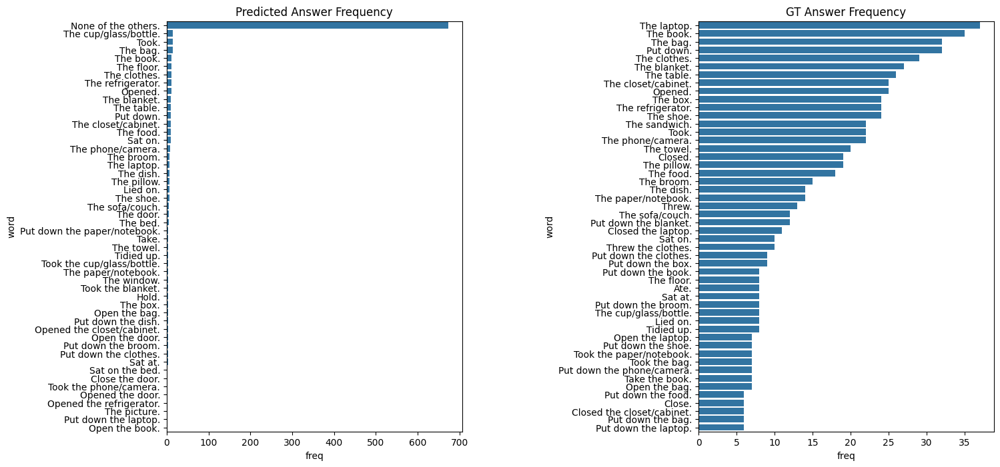

In [17]:
freq_pred = pred_sgg_df['pred_text'].value_counts().reset_index()
freq_pred.columns = ["word", "freq"]

freq_gt = gt_df['text'].value_counts().reset_index()
freq_gt.columns = ["word", "freq"]


fig, axes = plt.subplots(
    1, 2,
    figsize=(16, 8),
    gridspec_kw={'wspace': 0.8}   # adjust wspace to taste
)

sns.barplot(
    data=freq_pred.sort_values('freq', ascending=False)[:50],
    x="freq", y="word",
    ax=axes[0]
)
axes[0].set_title("Predicted Answer Frequency")

sns.barplot(
    data=freq_gt.sort_values('freq', ascending=False)[:50],
    x="freq", y="word",
    ax=axes[1]
)

axes[1].set_title("GT Answer Frequency")
plt.show()


That's way. For > half of the Q the model answers with None of the others.

<Axes: xlabel='freq', ylabel='word'>

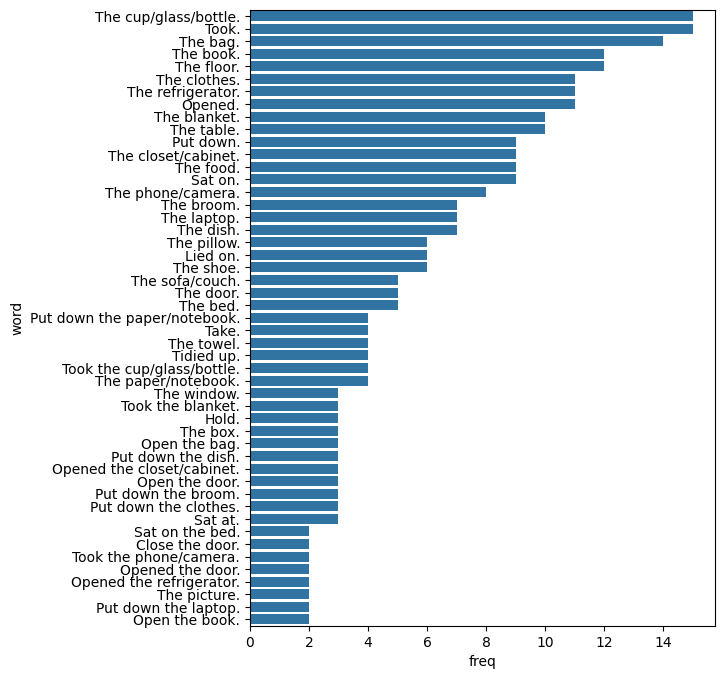

In [18]:
plt.figure(figsize=(6, 8))
sns.barplot(data=freq_pred.iloc[1:50], x='freq', y='word')


### Reasoning token length

In [19]:
gemma3_tokenizer = AutoTokenizer.from_pretrained(
    "google/gemma-3-4b-it",
    auth_token=hugg_auth_token
)


Reasoning length:

In [20]:
reasoning_token_len_sgg = pred_sgg_df['chat_history'].apply(lambda x: len(gemma3_tokenizer.tokenize(x[1]['content'])))
reasoning_token_len_sgg.describe()


count    1035.000000
mean      524.463768
std       129.636553
min       283.000000
25%       466.000000
50%       510.000000
75%       560.000000
max      2048.000000
Name: chat_history, dtype: float64

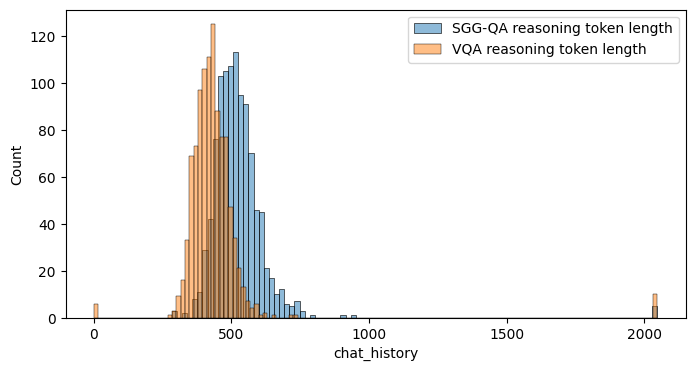

In [38]:
reasoning_token_len_vqa = pred_vqa_df['chat_history'].apply(lambda x: len(gemma3_tokenizer.tokenize(x[1]['content'])))

plt.figure(figsize=(8,4))

sns.histplot(reasoning_token_len_sgg, alpha=.5, label="SGG-QA reasoning token length")
sns.histplot(reasoning_token_len_vqa, alpha=.5, label="VQA reasoning token length")
plt.legend()


The reasoning token is not too different form other experiments.

### Looking at some of the answers

In [22]:
rp.print_acc(eval_df2.loc[prev_analyzed], lambda x: rp.accuracy(x, on_what='text'))


Question type       Total      Accuracy 

Interaction          15         33.33%  
Sequence              0          nan%   
Prediction            0          nan%   
Feasibility           0          nan%   

Average              15         33.33%  


/home/lusha/star_code/src/response_processing.py:13: RuntimeWarning: invalid value encountered in scalar divide
  return hits_text / eval_df.shape[0]
/home/lusha/star_code/src/response_processing.py:13: RuntimeWarning: invalid value encountered in scalar divide
  return hits_text / eval_df.shape[0]
/home/lusha/star_code/src/response_processing.py:13: RuntimeWarning: invalid value encountered in scalar divide
  return hits_text / eval_df.shape[0]


In 1/3 (= 5 samples) of the manually inspected samples the new fps based model is able to answer correctly. Let's see why...

In [23]:
correct_idx = (eval_df2.loc[prev_analyzed, 'text'] == eval_df2.loc[prev_analyzed, 'pred_text'])
correct_idx =  correct_idx[correct_idx].index
correct_idx


Index(['Interaction_T1_8913', 'Interaction_T2_3423', 'Interaction_T1_2226',
       'Interaction_T1_8274', 'Interaction_T1_4221'],
      dtype='string', name='id')

#### 0

In [24]:
idx = correct_idx[0]


In [25]:
qa_viz.compact_print_qa(idx, gt_df.rename(columns={'text': 'answer'}), [pred_sgg_df.rename(columns={'pred_text': 'answer'})])



┌─ Sample: Interaction_T1_8913 ─────────────────────────────────────────────────────────────
│
│ Question:
│    Which object was taken by the person?
│ Alternatives:
│    0. The paper/notebook.
│    1. The laptop.
│    2. The bag.
│    3. The cup/glass/bottle.
│
│ Ground Truth:
│    The paper/notebook.
│
|
│ Model Predictions - Prediction 1:
│    Prediction:  The paper/notebook. [CORRECT]
│    Reasoning:
│        Okay, let's analyze the scene graph and answer the question step-by-step.
│        
│        **1. Question Interpretation:**
│        
│        The question asks: "Which object was taken by the person?" This means we need to identify the object that the person (the ‘man’) is holding or interacting with in a way that suggests it’s being moved or carried.
│        
│        **2. STSG Analysis:**
│        
│        The scene graph describes the following relationships:
│        
│        *   **Frame 0:** man ---- sitting_on ---- chair, laptop ---- on ---- desk, paper ---- held_b

In [26]:
videoviz.Vis_Video(
    {"question_id": idx, **gt_df.loc[idx].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  11.9s - 16.5s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

In [27]:
print(pred_sgg_df.loc[idx]['chat_history'][0]['content'])


Please carefully read the following Spatio-Temporal Scene Graph delimited by the <STSG> tags and provide an answer to the question below:

<STSG>
Here’s a scene graph representing the observed events, organized by frame and utilizing the specified format:

<scene_graph>

**Frame 0:**
<scene_graph>
man ---- sitting_on ---- chair
laptop ---- on ---- desk
paper ---- held_by ---- man
sheets ---- on ---- table
</scene_graph>

**Frame 1:**
<scene_graph>
man ---- leaning_towards ---- desk
laptop ---- on ---- desk
paper ---- held_by ---- man
sheets ---- on ---- table
</scene_graph>

**Frame 2:**
<scene_graph>
man ---- leaning_towards ---- desk
laptop ---- on ---- desk
paper ---- held_by ---- man
sheets ---- on ---- table
</scene_graph>

**Frame 3:**
<scene_graph>
man ---- leaning_towards ---- desk
laptop ---- on ---- desk
paper ---- held_by ---- man
sheets ---- on ---- table
</scene_graph>

**Frame 4:**
<scene_graph>
man ---- sitting_on ---- chair
laptop ---- on ---- desk
paper ---- held_by --

#### 1

In [28]:
idx = correct_idx[1]


In [29]:
qa_viz.compact_print_qa(idx, gt_df.rename(columns={'text': 'answer'}), [pred_sgg_df.rename(columns={'pred_text': 'answer'})])



┌─ Sample: Interaction_T2_3423 ─────────────────────────────────────────────────────────────
│
│ Question:
│    What did the person do with the bed?
│ Alternatives:
│    0. Sat on.
│    1. Closed.
│    2. Lied on.
│    3. Washed.
│
│ Ground Truth:
│    Lied on.
│
|
│ Model Predictions - Prediction 1:
│    Prediction:  Lied on. [CORRECT]
│    Reasoning:
│        Okay, let's analyze the scene graph and answer the question.
│        
│        **1. Question Interpretation:**
│        
│        The question asks: "What did the person do with the bed?"  We need to identify the action associated with the bed throughout the video frames.
│        
│        **2. STSG Analysis:**
│        
│        The scene graph describes the state of the scene at each frame.  Crucially, it repeatedly states: “child ---- lying_on ---- bed”. This indicates the child is lying *on* the bed.  The other relationships (bed located in room, room painted reddish-brown, bed located near window, window has curtain, bed

In [30]:
videoviz.Vis_Video(
    {"question_id": idx, **gt_df.loc[idx].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  0.0s - 6.8s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

In [31]:
print(pred_sgg_df.loc[idx]['chat_history'][0]['content'])


Please carefully read the following Spatio-Temporal Scene Graph delimited by the <STSG> tags and provide an answer to the question below:

<STSG>
Here’s a scene graph representing the video, incorporating the details from the previous analysis:

<scene_graph>

**Frame 0:**
child ---- lying_on ---- bed
bed ---- located_in ---- room
room ---- painted_in ---- reddish-brown
bed ---- located_near ---- window
window ---- has ---- curtain
curtain ---- is ---- white
bed ---- has ---- pillow
pillow ---- is ---- white

**Frame 1:**
child ---- lying_on ---- bed
bed ---- located_in ---- room
room ---- painted_in ---- reddish-brown
bed ---- located_near ---- window
window ---- has ---- curtain
curtain ---- is ---- white
bed ---- has ---- pillow
pillow ---- is ---- white

**Frame 2:**
child ---- lying_on ---- bed
bed ---- located_in ---- room
room ---- painted_in ---- reddish-brown
bed ---- located_near ---- window
window ---- has ---- curtain
curtain ---- is ---- white
bed ---- has ---- pillow
pill

#### 2

In [40]:
idx = correct_idx[2]


In [41]:
qa_viz.compact_print_qa(idx, gt_df.rename(columns={'text': 'answer'}), [pred_sgg_df.rename(columns={'pred_text': 'answer'})])



┌─ Sample: Interaction_T1_2226 ─────────────────────────────────────────────────────────────
│
│ Question:
│    Which object was taken by the person?
│ Alternatives:
│    0. The shoe.
│    1. The blanket.
│    2. The box.
│    3. The laptop.
│
│ Ground Truth:
│    The shoe.
│
|
│ Model Predictions - Prediction 1:
│    Prediction:  The shoe. [CORRECT]
│    Reasoning:
│        Okay, let's analyze the scene graph and answer the question.
│        
│        **1. Question Interpretation:**
│        
│        The question asks: "Which object was taken by the person?" This means we need to identify the object that the person (the man) is actively moving or holding in a way that suggests it's being carried or brought to him.
│        
│        **2. STSG Analysis:**
│        
│        Let's examine the relationships in the scene graph frame by frame:
│        
│        *   **Frame 0:** The man is reaching *for* a white bag. This indicates he’s acquiring the bag.
│        *   **Frame 1:** The m

In [42]:
videoviz.Vis_Video(
    {"question_id": idx, **gt_df.loc[idx].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  8.0s - 13.0s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

In [43]:
print(pred_sgg_df.loc[idx]['chat_history'][0]['content'])


Please carefully read the following Spatio-Temporal Scene Graph delimited by the <STSG> tags and provide an answer to the question below:

<STSG>
Here’s a scene graph representing the observed actions and relationships, organized by frame and utilizing the specified format:

<scene_graph>

**Frame 0:**
man ---- reaching_for ---- white_bag
white_bag ---- located_on ---- table
table ---- located_in ---- indoor_space
indoor_space ---- contains ---- large_screens

**Frame 1:**
man ---- adjusting ---- white_bag
white_bag ---- tilted_towards ---- man
man ---- bending_over ---- table

**Frame 2:**
man ---- pulling_up ---- white_bag
white_bag ---- held_by ---- man
man ---- lifting_up ---- white_bag

**Frame 3:**
man ---- holding ---- white_bag
white_bag ---- presented_to ---- man
man ---- examining ---- white_bag

**Frame 4:**
man ---- holding_up ---- white_bag
white_bag ---- contained_within ---- man’s_hands
</scene_graph>
</STSG>

Given the following question:
<Q>
Which object was taken by t

## Correlation

In [220]:
pred_vqa_df.rename(columns={'pred_text': 'pred_text1'}, inplace=True)
pred_sgg_df.rename(columns={'pred_text': 'pred_text2'}, inplace=True)
eval_df_all = gt_df.join(
    pred_vqa_df['pred_text1'],
    how='inner'
).join(
    pred_sgg_df['pred_text2'],
    how='inner'
)

eval_df_all['text'] = eval_df_all['text'].str.lower()
eval_df_all['pred_text1'] = eval_df_all['pred_text1'].str.lower()
eval_df_all['pred_text2'] = eval_df_all['pred_text2'].str.lower()
eval_df_all


,question,video_id,start,end,text,question_program,choices,situations,pred_text1,pred_text2
id,,,,,,,,,,
Feasibility_T5_102,Which object is the person able to throw after...,ATV2F,0.0,4.000,the clothes.,"[{'function': 'Situations', 'value_input': []}...","[{'choice_id': 0, 'choice': 'The bag.', 'choic...","{'000031': {'rel_pairs': [['o000', 'o019'], ['...",the bag.,the bag.
Feasibility_T2_860,What else is the person able to do with the wi...,9J166,9.9,17.500,close the window.,"[{'function': 'Situations', 'value_input': []}...","[{'choice_id': 0, 'choice': 'Lie on the window...","{'000321': {'rel_pairs': [['o000', 'o017'], ['...",hold the window.,none of the others.
Feasibility_T2_556,What else is the person able to do with the cl...,ANA5N,4.3,10.300,open the closet/cabinet.,"[{'function': 'Situations', 'value_input': []}...","[{'choice_id': 0, 'choice': 'Tidy up the close...","{'000390': {'rel_pairs': [['o000', 'o011'], ['...",open the closet/cabinet.,none of the others.
Prediction_T1_2539,What will the person do next?,Z6HEA,0.0,10.875,sit on the floor.,"[{'function': 'Situations', 'value_input': []}...","[{'choice_id': 0, 'choice': 'Sit on the floor....","{'000021': {'rel_pairs': [['o000', 'o027'], ['...",open the bag.,none of the others.
Prediction_T4_1253,Which object would the person throw next after...,FRLW2,3.4,27.275,the shoe.,"[{'function': 'Situations', 'value_input': []}...","[{'choice_id': 0, 'choice': 'The pillow.', 'ch...","{'000811': {'rel_pairs': [['o000', 'o022'], ['...",none of the above.,none of the others.
...,...,...,...,...,...,...,...,...,...,...
Interaction_T1_8913,Which object was taken by the person?,F9YMU,11.9,16.500,the paper/notebook.,"[{'function': 'Situations', 'value_input': []}...","[{'choice_id': 0, 'choice': 'The paper/noteboo...","{'000213': {'rel_pairs': [['o000', 'o006'], ['...",the paper/notebook.,the paper/notebook.
Interaction_T1_8967,Which object was taken by the person?,1333C,8.0,13.100,the dish.,"[{'function': 'Situations', 'value_input': []}...","[{'choice_id': 0, 'choice': 'The towel.', 'cho...","{'000241': {'rel_pairs': [['o000', 'o027'], ['...",none of the above.,the box.
Interaction_T2_1847,What did the person do with the paper/notebook?,1TIAK,8.3,12.500,took.,"[{'function': 'Situations', 'value_input': []}...","[{'choice_id': 0, 'choice': 'Put down.', 'choi...","{'000210': {'rel_pairs': [['o000', 'o011']], '...",took.,took.


In [221]:
eval_df_all['pred_text2'].str.startswith("none",).sum()


np.int64(640)

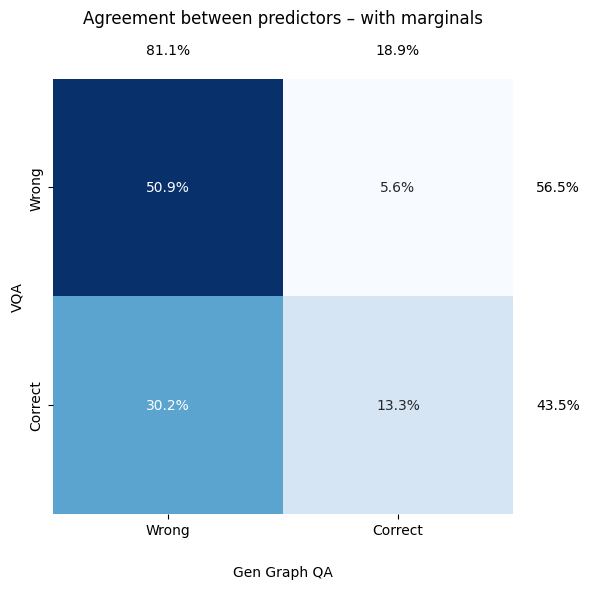

In [222]:
# your data
display_eval = eval_df_all
pred_vqa_correct = (display_eval['text'] == display_eval['pred_text1']).astype(int).values
pred_gg_correct  = (display_eval['text'] == display_eval['pred_text2']).astype(int).values
labels = ['Wrong', 'Correct']

# confusion matrix (normalized over all)
cm = confusion_matrix(pred_vqa_correct, pred_gg_correct, normalize='all')

# compute marginal sums and convert to % of total
row_totals = cm.sum(axis=1)
col_totals = cm.sum(axis=0)
total = cm.sum()
row_pct = row_totals / total
col_pct = col_totals / total

fig, ax = plt.subplots(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='.1%', cmap='Blues',
            xticklabels=labels, yticklabels=labels,
            cbar=False, ax=ax)

# annotate row marginals at the right of each row
for i, p in enumerate(row_pct):
    ax.text(len(labels) + 0.1,  i + 0.5, f'{p:.1%}', 
            va='center', ha='left', fontsize=10)

# annotate column marginals just above each column
for j, p in enumerate(col_pct):
    ax.text(j + 0.5, -0.1, f'{p:.1%}', 
            ha='center', va='bottom', fontsize=10)

# move x-axis labels (and xlabel) to the top
ax.set_xlabel('Gen Graph QA', labelpad=20)
ax.set_ylabel('VQA')
ax.set_title('Agreement between predictors – with marginals', pad=40)

# make xtick labels horizontal
ax.set_xticklabels(labels, rotation=0)

plt.tight_layout()
plt.show()


The graph above tell us the following insights:
- In ~20% the samples the VQA is able to guess the right response where the Graph based QA mistakes
- On the other hand, there's a significant 12% where the Graph based QA is correct and the VQA is wrong


In [119]:
vqa_correct_gg_wrong = pred_vqa_correct & ~pred_gg_correct
mask = vqa_correct_gg_wrong.astype(bool)


In [120]:
indices = eval_df_all[mask].index
test1 = indices[0]


In [121]:
qa_viz.compact_print_qa(
    test1, gt_df.rename(columns={'text': 'answer'}),
    [pred_vqa_df.rename(columns={'pred_text1': 'answer'}), pred_sgg_df.rename(columns={'pred_text2': 'answer'})],
    ['VQA', 'SGG-QA'])



┌─ Sample: Feasibility_T2_556 ──────────────────────────────────────────────────────────────
│
│ Question:
│    What else is the person able to do with the closet/cabinet?
│ Alternatives:
│    0. Tidy up the closet/cabinet.
│    1. Open the closet/cabinet.
│    2. Close the closet/cabinet.
│    3. Wash the closet/cabinet.
│
│ Ground Truth:
│    Open the closet/cabinet.
│
|
│ Model Predictions - VQA:
│    Prediction:  Open the closet/cabinet. [CORRECT]
│    Reasoning:
│        Okay, let’s analyze the video and respond to the question.
│        
│        **1. Question Interpretation:** The question asks what the person is doing with the closet/cabinet, implying an action related to opening or manipulating it.
│        
│        **2. Video Analysis:**
│        *   **Frame Sequence:** The video shows a woman in a black dress repeatedly holding and manipulating a light-colored, draped fabric (likely a scarf or shawl) in front of a closed door. She’s adjusting the fabric, pulling it, and se

In [122]:
test1 = indices[1]
qa_viz.compact_print_qa(
    test1, gt_df.rename(columns={'text': 'answer'}),
    [pred_vqa_df.rename(columns={'pred_text1': 'answer'}), pred_sgg_df.rename(columns={'pred_text2': 'answer'})],
    ['VQA', 'SGG-QA'])



┌─ Sample: Feasibility_T5_1851 ─────────────────────────────────────────────────────────────
│
│ Question:
│    Which object is the person able to close after taking the cup/glass/bottle?
│ Alternatives:
│    0. The door.
│    1. The book.
│    2. The laptop.
│    3. The closet/cabinet.
│
│ Ground Truth:
│    The laptop.
│
|
│ Model Predictions - VQA:
│    Prediction:  the laptop. [CORRECT]
│    Reasoning:
│        Okay, let’s analyze the video and respond to the question.
│        
│        **1. Question Interpretation:** The question asks which object the person is able to close after taking a cup/glass/bottle. This implies a physical action – closing something.
│        
│        **2. Video Analysis:**
│        
│        *   **Person:** The person is seated in a wheelchair, holding a cup/glass/bottle and appears to be drinking from it.
│        *   **Objects in the Scene:** The scene includes a table, a laptop, a book, a door (partially visible), and a closet/cabinet.
│        *   

In [123]:
test1 = indices[2]
qa_viz.compact_print_qa(
    test1, gt_df.rename(columns={'text': 'answer'}),
    [pred_vqa_df.rename(columns={'pred_text1': 'answer'}), pred_sgg_df.rename(columns={'pred_text2': 'answer'})],
    ['VQA', 'SGG-QA'])




┌─ Sample: Prediction_T2_450 ───────────────────────────────────────────────────────────────
│
│ Question:
│    What will the person do next with the clothes?
│ Alternatives:
│    0. Put down.
│    1. Take.
│    2. Throw.
│    3. Sit at.
│
│ Ground Truth:
│    Take.
│
|
│ Model Predictions - VQA:
│    Prediction:  Take. [CORRECT]
│    Reasoning:
│        Okay, let's analyze the video and answer the question.
│        
│        **1. Question Interpretation:** The question asks what the person will *do next* with the clothes. It’s essentially asking about the next action observed in the video.
│        
│        **2. Video Analysis:**
│        
│        *   **Initial Observation:** The video shows a person (likely a woman) kneeling and bending over a laundry sink. She is holding a small, white, plastic object (possibly a toy or a small cleaning tool) in her hand. She appears to be examining something on the floor near the sink.
│        *   **Subsequent Actions:** The person is now care

## Inspecting the performance of VQA on previously inspected samples


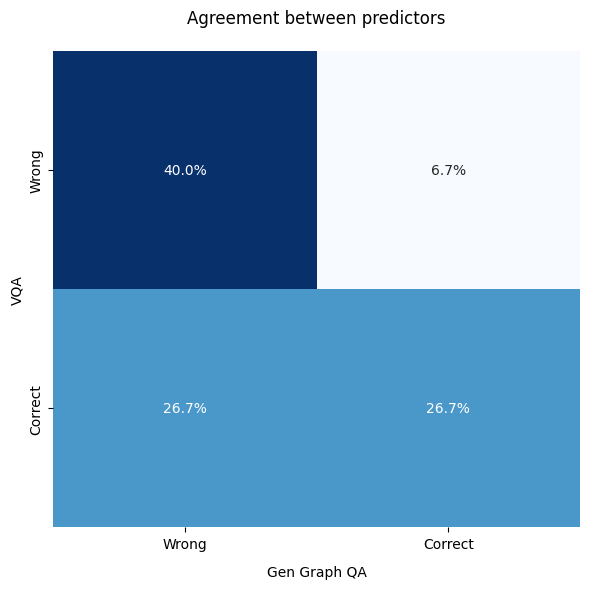

In [124]:
display_eval = eval_df_all.loc[prev_analyzed]

pred_vqa_correct = (display_eval['text'] == display_eval['pred_text1']).astype(int).values
pred_sgg_correct  = (display_eval['text'] == display_eval['pred_text2']).astype(int).values
labels = ['Wrong', 'Correct']

# confusion matrix (normalized over all)
cm = confusion_matrix(pred_vqa_correct, pred_sgg_correct, normalize='all')

# compute marginal sums and convert to % of total
row_totals = cm.sum(axis=1)
col_totals = cm.sum(axis=0)
total = cm.sum()
row_pct = row_totals / total
col_pct = col_totals / total

fig, ax = plt.subplots(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='.1%', cmap='Blues',
            xticklabels=labels, yticklabels=labels,
            cbar=False, ax=ax)

# move x-axis labels (and xlabel) to the top
ax.set_xlabel('Gen Graph QA', labelpad=10)
ax.set_ylabel('VQA')
ax.set_title('Agreement between predictors', pad=20)

# make xtick labels horizontal
ax.set_xticklabels(labels, rotation=0)

plt.tight_layout()
plt.show()


In [125]:
vqa_correct_sgg_wrong = pred_vqa_correct & ~pred_sgg_correct
mask = vqa_correct_sgg_wrong.astype(bool)
indices = display_eval[mask].index



In [126]:
test1 = indices[0]
qa_viz.compact_print_qa(
    test1, gt_df.rename(columns={'text': 'answer'}),
    [pred_vqa_df.rename(columns={'pred_text1': 'answer'}), pred_sgg_df.rename(columns={'pred_text2': 'answer'})],
    ['VQA', 'SGG-QA'])



┌─ Sample: Interaction_T1_1168 ─────────────────────────────────────────────────────────────
│
│ Question:
│    Which object was taken by the person?
│ Alternatives:
│    0. The phone/camera.
│    1. The food.
│    2. The laptop.
│    3. The bag.
│
│ Ground Truth:
│    The phone/camera.
│
|
│ Model Predictions - VQA:
│    Prediction:  the phone/camera. [CORRECT]
│    Reasoning:
│        Okay, let’s analyze the video and answer the question.
│        
│        **1. Question Interpretation:** The question asks what object the person is holding in the image.
│        
│        **2. Video Analysis:**
│        *   The person is holding a small, rectangular object in their hands. It appears to be a phone or camera. The object is held up to the camera, suggesting it’s being used to take a picture or video. The person is looking at the object.
│        *   There is a dog sitting next to the person. The dog is looking at the person and the object.
│        
│        **3. Alternative Evaluation

In [127]:
test1 = indices[1]
qa_viz.compact_print_qa(
    test1, gt_df.rename(columns={'text': 'answer'}),
    [pred_vqa_df.rename(columns={'pred_text1': 'answer'}), pred_sgg_df.rename(columns={'pred_text2': 'answer'})],
    ['VQA', 'SGG-QA'])



┌─ Sample: Interaction_T1_309 ──────────────────────────────────────────────────────────────
│
│ Question:
│    Which object was tidied up by the person?
│ Alternatives:
│    0. The clothes.
│    1. The closet/cabinet.
│    2. The table.
│    3. The broom.
│
│ Ground Truth:
│    The table.
│
|
│ Model Predictions - VQA:
│    Prediction:  The table. [CORRECT]
│    Reasoning:
│        Okay, let's analyze the video and respond to the question.
│        
│        **1. Question Interpretation:** The question asks what object the person is tidying up.
│        
│        **2. Video Analysis:**
│        
│        The video shows a man in a baseball cap and a white shirt, standing on a tiled floor. He is holding a cardboard box. He appears to be manipulating the box, possibly opening it or examining its contents. The box is the primary object of his attention. There is no evidence of him tidying up clothes, a closet/cabinet, or a broom. The scene suggests he is dealing with the box itself.
│  

In [128]:
videoviz.Vis_Video(
    {"question_id": test1, **gt_df.loc[test1].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  11.9s - 19.1s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

Sat on is an acceptable answer for the video in question. Therefore the GGQ Answer can't be considered wrong.

In [130]:
test1 = indices[2]
qa_viz.compact_print_qa(
    test1, gt_df.rename(columns={'text': 'answer'}),
    [pred_vqa_df.rename(columns={'pred_text1': 'answer'}), pred_sgg_df.rename(columns={'pred_text2': 'answer'})],
    ['VQA', 'SGG-QA'])



┌─ Sample: Interaction_T1_4703 ─────────────────────────────────────────────────────────────
│
│ Question:
│    Which object was taken by the person?
│ Alternatives:
│    0. The broom.
│    1. The phone/camera.
│    2. The towel.
│    3. The clothes.
│
│ Ground Truth:
│    The phone/camera.
│
|
│ Model Predictions - VQA:
│    Prediction:  The phone/camera. [CORRECT]
│    Reasoning:
│        Okay, let’s analyze the video and respond to the question.
│        
│        **1. Question Interpretation:** The question asks: “Which object was taken by the person?”
│        
│        **2. Video Analysis:**
│        
│        I’ve reviewed the sequence of images. The person is repeatedly shown holding an object in their hand. Initially, it appears to be a small, ornate lantern. As the sequence progresses, the person’s hand is seen holding what appears to be a phone or camera. The camera is held in a way that suggests it’s being actively used – pointed and possibly being taken a picture. The per

In [131]:
videoviz.Vis_Video(
    {"question_id": test1, **gt_df.loc[test1].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  12.5s - 19.5s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

In [132]:
test1 = indices[3]
qa_viz.compact_print_qa(
    test1, gt_df.rename(columns={'text': 'answer'}),
    [pred_vqa_df.rename(columns={'pred_text1': 'answer'}), pred_sgg_df.rename(columns={'pred_text2': 'answer'})],
    ['VQA', 'SGG-QA'])



┌─ Sample: Interaction_T1_5709 ─────────────────────────────────────────────────────────────
│
│ Question:
│    Which object was put down by the person?
│ Alternatives:
│    0. The bag.
│    1. The food.
│    2. The laptop.
│    3. The cup/glass/bottle.
│
│ Ground Truth:
│    The bag.
│
|
│ Model Predictions - VQA:
│    Prediction:  The bag. [CORRECT]
│    Reasoning:
│        Okay, let's analyze the video and answer the question.
│        
│        **1. Question Interpretation:** The question asks: “Which object was put down by the person?”
│        
│        **2. Video Analysis:**
│        *   **Person:** A person is standing in the kitchen, holding a bag.
│        *   **Action:** The person is lowering the bag down.
│        *   **Objects:** The scene includes a refrigerator, cabinets, a microwave, a stove, a table, a bag, and a can of soda.
│        
│        **3. Alternative Evaluation:**
│        
│        *   **A. The bag:** This is the most likely answer. The video clearly show

In [133]:
videoviz.Vis_Video(
    {"question_id": test1, **gt_df.loc[test1].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  1.7s - 10.7s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

In [134]:
test1 = indices[4]
qa_viz.compact_print_qa(
    test1, gt_df.rename(columns={'text': 'answer'}),
    [pred_vqa_df.rename(columns={'pred_text1': 'answer'}), pred_sgg_df.rename(columns={'pred_text2': 'answer'})],
    ['VQA', 'SGG-QA'])


IndexError: index 4 is out of bounds for axis 0 with size 4

In [86]:
videoviz.Vis_Video(
    {"question_id": test1, **gt_df.loc[test1].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  1.7s - 10.7s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

In [99]:
vqa_correct_gg_wrong = (~pred_vqa_correct) & (~pred_gg_correct)
mask = vqa_correct_gg_wrong.astype(bool)
indices = display_eval[mask].index



In [97]:
indices


Index(['Interaction_T1_4054', 'Interaction_T1_8913', 'Interaction_T2_3423',
       'Interaction_T1_4115', 'Interaction_T1_1168', 'Interaction_T1_309',
       'Interaction_T1_4703', 'Interaction_T1_2516', 'Interaction_T1_8967',
       'Interaction_T1_5709', 'Interaction_T1_2226', 'Interaction_T1_111',
       'Interaction_T1_8274', 'Interaction_T1_7254', 'Interaction_T1_4221'],
      dtype='object')

In [88]:
test1 = indices[0]
qa_viz.compact_print_qa(
    test1, gt_df.rename(columns={'text': 'answer'}),
    [pred_vqa_df.rename(columns={'pred_text1': 'answer'}), pred_sgg_df.rename(columns={'pred_text2': 'answer'})],
    ['VQA', 'SGG-QA'])



┌─ Sample: Interaction_T1_4054 ─────────────────────────────────────────────────────────────
│
│ Question:
│    Which object was opened by the person?
│ Alternatives:
│    0. The bag.
│    1. The closet/cabinet.
│    2. The refrigerator.
│    3. The laptop.
│
│ Ground Truth:
│    The closet/cabinet.
│
|
│ Model Predictions - VQA:
│    Prediction:  The bag. [WRONG]
│    Reasoning:
│        Okay, let’s analyze the video and respond to the question.
│        
│        **1. Question Interpretation:** The question asks: “Which object was opened by the person?” This implies we need to identify what the person is interacting with and potentially manipulating to open something.
│        
│        **2. Video Analysis:**
│        
│        *   **Recurring Objects:** The most prominent recurring object is a large, dark-colored plush toy (likely a bear) that the person is holding and interacting with. There’s also a bed, a small table with a red object (possibly a drink or item), and a green pill

In [89]:
videoviz.Vis_Video(
    {"question_id": test1, **gt_df.loc[test1].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  6.0s - 13.0s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

In [95]:
display_eval.loc[test1]


question                        Which object was taken by the person?
video_id                                                        F9YMU
start                                                            11.9
end                                                              16.5
text                                              the paper/notebook.
question_program    [{'function': 'Situations', 'value_input': []}...
choices             [{'choice_id': 0, 'choice': 'The paper/noteboo...
situations          {'000213': {'rel_pairs': [['o000', 'o006'], ['...
pred_text1                                        the paper/notebook.
pred_text2                                                   the bag.
Name: Interaction_T1_8913, dtype: object

In [94]:
pred_vqa_df.loc[test1]


pred_text1                                    The paper/notebook.
chat_history    [{'role': 'user', 'content': 'You are an intel...
Name: Interaction_T1_8913, dtype: object

In [93]:
test1 = indices[1]
qa_viz.compact_print_qa(
    test1, gt_df.rename(columns={'text': 'answer'}),
    [pred_vqa_df.rename(columns={'pred_text1': 'answer'}), pred_sgg_df.rename(columns={'pred_text2': 'answer'})],
    ['VQA', 'SGG-QA'])




┌─ Sample: Interaction_T1_8913 ─────────────────────────────────────────────────────────────
│
│ Question:
│    Which object was taken by the person?
│ Alternatives:
│    0. The paper/notebook.
│    1. The laptop.
│    2. The bag.
│    3. The cup/glass/bottle.
│
│ Ground Truth:
│    The paper/notebook.
│
|
│ Model Predictions - VQA:
│    Prediction:  The paper/notebook. [CORRECT]
│    Reasoning:
│        Okay, let's analyze the video and answer the question.
│        
│        **1. Question Interpretation:** The question asks “Which object was taken by the person?” This means we need to identify what the person is holding or interacting with in the video.
│        
│        **2. Video Analysis:**
│        *   **Frame 1-4:** The person is sitting at a desk with a laptop. They are holding a paper/notebook. They appear to be writing on it.
│        *   **Frame 5-6:** The person continues to hold the paper/notebook.
│        *   **Frame 7-8:** The person is still holding the paper/noteboo

In [49]:
videoviz.Vis_Video(
    {"question_id": test1, **gt_df.loc[test1].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  11.9s - 16.5s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

Sat on is an acceptable answer for the video in question. Therefore the GGQ Answer can't be considered wrong.

In [50]:
test1 = indices[2]
qa_viz.compact_print_qa(
    test1, gt_df.rename(columns={'text': 'answer'}),
    [pred_vqa_df.rename(columns={'pred_text1': 'answer'}), pred_sgg_df.rename(columns={'pred_text2': 'answer'})],
    ['VQA', 'SGG-QA'])



┌─ Sample: Interaction_T2_3423 ─────────────────────────────────────────────────────────────
│
│ Question:
│    What did the person do with the bed?
│ Alternatives:
│    0. Sat on.
│    1. Closed.
│    2. Lied on.
│    3. Washed.
│
│ Ground Truth:
│    Lied on.
│
|
│ Model Predictions - VQA:
│    Prediction:  Lied on. [CORRECT]
│    Reasoning:
│        Okay, let's analyze the video and answer the question.
│        
│        **1. Question Interpretation:** The question asks what the person was doing with the bed. It’s seeking a description of the person’s interaction with the bed.
│        
│        **2. Video Analysis:**
│        *   **Person:** A young child is lying on the bed. They are partially covered by the bedclothes. They appear to be relaxed, possibly resting or sleeping.
│        *   **Bed:** The bed is covered with a patterned quilt. The bed is the central element of the scene.
│        *   **Interaction:** The child is lying *on* the bed. They are not sitting on it, closi

In [51]:
videoviz.Vis_Video(
    {"question_id": test1, **gt_df.loc[test1].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  0.0s - 6.8s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

In [52]:
test1 = indices[3]
qa_viz.compact_print_qa(
    test1, gt_df.rename(columns={'text': 'answer'}),
    [pred_vqa_df.rename(columns={'pred_text1': 'answer'}), pred_sgg_df.rename(columns={'pred_text2': 'answer'})],
    ['VQA', 'SGG-QA'])




┌─ Sample: Interaction_T1_4115 ─────────────────────────────────────────────────────────────
│
│ Question:
│    Which object was put down by the person?
│ Alternatives:
│    0. The pillow.
│    1. The box.
│    2. The laptop.
│    3. The sandwich.
│
│ Ground Truth:
│    The laptop.
│
|
│ Model Predictions - VQA:
│    Prediction:  The laptop. [CORRECT]
│    Reasoning:
│        Okay, let’s analyze the video and answer the question.
│        
│        **1. Question Interpretation:** The question asks: “Which object was put down by the person?”
│        
│        **2. Video Analysis:**
│        *   **Frame 1 & 2:** A person is sitting on a couch, using a laptop. They are holding the laptop with their hands.
│        *   **Frame 3 & 4:** The person is now standing up and appears to be placing the laptop down on the couch.
│        
│        **3. Alternative Evaluation:**
│        
│        *   **A. The pillow:** The pillow is visible in the first frames, but the person is not interacting w

In [53]:
videoviz.Vis_Video(
    {"question_id": test1, **gt_df.loc[test1].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  14.6s - 19.7s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw

In [54]:
test1 = indices[4]
qa_viz.compact_print_qa(
    test1, gt_df.rename(columns={'text': 'answer'}),
    [pred_vqa_df.rename(columns={'pred_text1': 'answer'}), pred_sgg_df.rename(columns={'pred_text2': 'answer'})],
    ['VQA', 'SGG-QA'])




┌─ Sample: Interaction_T1_1168 ─────────────────────────────────────────────────────────────
│
│ Question:
│    Which object was taken by the person?
│ Alternatives:
│    0. The phone/camera.
│    1. The food.
│    2. The laptop.
│    3. The bag.
│
│ Ground Truth:
│    The phone/camera.
│
|
│ Model Predictions - VQA:
│    Prediction:  the phone/camera. [CORRECT]
│    Reasoning:
│        Okay, let’s analyze the video and answer the question.
│        
│        **1. Question Interpretation:** The question asks: “Which object was taken by the person?”
│        
│        **2. Video Analysis:**
│        
│        The video shows a person sitting on a bed, with a dog beside them. The person is holding a small, rectangular object in their hands. It appears to be a phone or camera. The person is looking at the object and manipulating it with their hands. The object is held in a way that suggests it’s being used – likely to take a photo or video. The person is clearly interacting with the obje

In [55]:
videoviz.Vis_Video(
    {"question_id": test1, **gt_df.loc[test1].to_dict()},
    RAW_VIDEO_DIR,
    SAVE_VIDEO_DIR)


	Video Seg:  0.0s - 3.1s


ffmpeg version 4.3 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7.3.0 (crosstool-NG 1.23.0.449-a04d0)
  configuration: --prefix=/opt/conda/conda-bld/ffmpeg_1597178665428/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placeh --cc=/opt/conda/conda-bld/ffmpeg_1597178665428/_build_env/bin/x86_64-conda_cos6-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-gnutls --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame
  libavutil      56. 51.100 / 56. 51.100
  libavcodec     58. 91.100 / 58. 91.100
  libavformat    58. 45.100 / 58. 45.100
  libavdevice    58. 10.100 / 58. 10.100
  libavfilter     7. 85.100 /  7. 85.100
  libavresample   4.  0.  0 /  4.  0.  0
  libsw